In [2]:
file_path_annotations = '/Users/yuen@backbase.com/Downloads/School/Emorec/emo-rec/data/processed_annotations.csv'
file_path_images1 = '/Users/yuen@backbase.com/Downloads/School/Emorec/emo-rec/data/Run_1'
file_path_images2 = '/Users/yuen@backbase.com/Downloads/School/Emorec/emo-rec/data/Run_2'

Annotation Analysis

In [4]:
import pandas as pd

df = pd.read_csv(file_path_annotations)
display(df.head())

,index,user,image_path,tags,age,valence,arousal,emotion,dec_factors,ambiguity,datetime
0,0,5fd97d5b40332e276ea58209,/Run_2/Loving toddlers sports/haiti-kids.jpg,Undefined,Children,0,2,Trust,"BodyLanguage,FacialExpression",0,2023-09-01 00:00:00.000000
1,5,5fd97d5b40332e276ea58209,/Run_2/Frustrated forty-something office/team-...,Undefined,Young Adults,0,2,Interest,FacialExpression,0,2023-09-01 00:00:00.000000
2,6,5985f6bdeef500000111db98,/Run_1/Violent youth festival/1042373588.jpg,Undefined,Young Adults,2,2,Interest,BodyLanguage,3,2023-09-01 00:00:00.000000
3,7,5985f6bdeef500000111db98,/Run_2/Remorseful toddlers court of law/dcfs-c...,Undefined,Adults,1,2,Interest,"BodyLanguage,FacialExpression",4,2023-09-01 00:00:00.000000
4,8,5fd97d5b40332e276ea58209,/Run_2/Shame elderly sports/3364887-46.jpg,Undefined,Adults,0,3,Apprehension,ConflictCtxtPerson,0,2023-09-01 00:00:00.000000


In [5]:
print("Number of rows:", len(df))

print("\nNumber of unique entries per column:")
for col in df.columns:
    print(f"- {col}: {df[col].nunique()}")

Number of rows: 19738

Number of unique entries per column:
- index: 19738
- user: 665
- image_path: 19738
- tags: 47
- age: 34
- valence: 7
- arousal: 7
- emotion: 24
- dec_factors: 58
- ambiguity: 7
- datetime: 18324


In [36]:
# DataFrame of annotations without matching images
df_annotations_without_image = df[df['normalized_image_path'].isin([p for p in annotated_image_paths if p not in image_paths_set])]
print("Annotations without matching images:")
display(df_annotations_without_image)

# DataFrame of images without matching annotations
df_images_without_annotation = pd.DataFrame({'image_path': list(image_paths_set - annotated_image_paths)})
print("Images without matching annotations:")
display(df_images_without_annotation)


Annotations without matching images:


,index,user,image_path,tags,age,valence,arousal,emotion,dec_factors,ambiguity,datetime,normalized_image_path
8,17,5fd97d5b40332e276ea58209,/Run_1/Accepting children school/whitecoatcere...,Undefined,Young Adults,0,0,Joy,FacialExpression,0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
33,59,5e9820b9c63c530008087a8c,/Run_2/Comforting adolescents playground/5edf6...,Undefined,"Children,Adults",2,5,Joy,Undefined,0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
36,62,5fd97d5b40332e276ea58209,/Run_2/Worry retiree prison/170412-O-ZZ999-412...,Undefined,Seniors,0,2,Acceptance,"BodyLanguage,FacialExpression",0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
40,73,5fd97d5b40332e276ea58209,/Run_2/Worry seniors fighting/463542923.jpg,Undefined,Adults,0,1,Anticipation,ConflictCtxtPerson,0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
46,91,5985f6bdeef500000111db98,/Run_2/Appalled youth court of law/service_2.jpg,Undefined,Adults,1,1,Serenity,FacialExpression,2,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
...,...,...,...,...,...,...,...,...,...,...,...,...
19696,31634,5fdf808af53c7a7e9199b430,/Run_2/Depressed soldiers holding/iStock-84718...,Undefined,"Children,Adults",1,3,Trust,"Context,FacialExpression",3,2023-12-21 18:20:15.259290,/Users/yuen@backbase.com/Downloads/School/Emor...
19716,31658,6522a42f39b5bd8f96735aa9,/Run_2/Frustrated youth shop/d3s_0659.jpg,Undefined,Adults,1,5,Anticipation,"FacialExpression,Staging",1,2023-12-21 18:39:19.776811,/Users/yuen@backbase.com/Downloads/School/Emor...
19727,31671,6522a42f39b5bd8f96735aa9,/Run_2/Scared midlife playing/3I67KO2O5JFCDMJF...,Undefined,Adults,-2,4,Rage,"Context,FacialExpression",2,2023-12-21 18:44:42.147747,/Users/yuen@backbase.com/Downloads/School/Emor...
19728,31672,6522a42f39b5bd8f96735aa9,/Run_2/Embarrassed adults movie/chappie11-1.jpg,Undefined,Adults,-2,4,Grief,"BodyLanguage,Context,FacialExpression",2,2023-12-21 18:45:05.843812,/Users/yuen@backbase.com/Downloads/School/Emor...


Images without matching annotations:


,image_path
0,/Users/yuen@backbase.com/Downloads/School/Emor...
1,/Users/yuen@backbase.com/Downloads/School/Emor...
2,/Users/yuen@backbase.com/Downloads/School/Emor...
3,/Users/yuen@backbase.com/Downloads/School/Emor...
4,/Users/yuen@backbase.com/Downloads/School/Emor...
...,...
501,/Users/yuen@backbase.com/Downloads/School/Emor...
502,/Users/yuen@backbase.com/Downloads/School/Emor...
503,/Users/yuen@backbase.com/Downloads/School/Emor...
504,/Users/yuen@backbase.com/Downloads/School/Emor...


In [37]:
# Filter df to only include rows with both annotation and matching image
matched_image_paths = set(df['normalized_image_path']).intersection(image_paths_set)
df_matched = df[df['normalized_image_path'].isin(matched_image_paths)].copy()

# Use df_matched for all further annotation analysis
print(f"Number of matched annotations: {len(df_matched)}")
display(df_matched.head())

Number of matched annotations: 18727


,index,user,image_path,tags,age,valence,arousal,emotion,dec_factors,ambiguity,datetime,normalized_image_path
0,0,5fd97d5b40332e276ea58209,/Run_2/Loving toddlers sports/haiti-kids.jpg,Undefined,Children,0,2,Trust,"BodyLanguage,FacialExpression",0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
1,5,5fd97d5b40332e276ea58209,/Run_2/Frustrated forty-something office/team-...,Undefined,Young Adults,0,2,Interest,FacialExpression,0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
2,6,5985f6bdeef500000111db98,/Run_1/Violent youth festival/1042373588.jpg,Undefined,Young Adults,2,2,Interest,BodyLanguage,3,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
3,7,5985f6bdeef500000111db98,/Run_2/Remorseful toddlers court of law/dcfs-c...,Undefined,Adults,1,2,Interest,"BodyLanguage,FacialExpression",4,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...
4,8,5fd97d5b40332e276ea58209,/Run_2/Shame elderly sports/3364887-46.jpg,Undefined,Adults,0,3,Apprehension,ConflictCtxtPerson,0,2023-09-01 00:00:00.000000,/Users/yuen@backbase.com/Downloads/School/Emor...


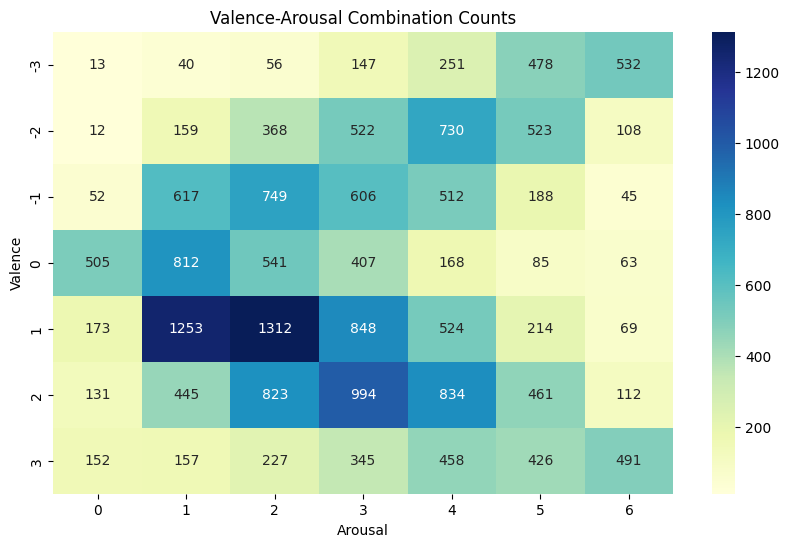

In [11]:
# Count of each valence-arousal combination
comb_counts = df.groupby(['valence', 'arousal']).size().reset_index(name='count')

import seaborn as sns
import matplotlib.pyplot as plt

pivot_table = comb_counts.pivot(index='valence', columns='arousal', values='count')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Valence-Arousal Combination Counts')
plt.ylabel('Valence')
plt.xlabel('Arousal')
plt.show()

/var/folders/0_/3pl6888s5j13pjsxp4wzz1s00000gp/T/ipykernel_22837/808001555.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=emotion_counts.index, y=emotion_counts.values, palette='viridis')


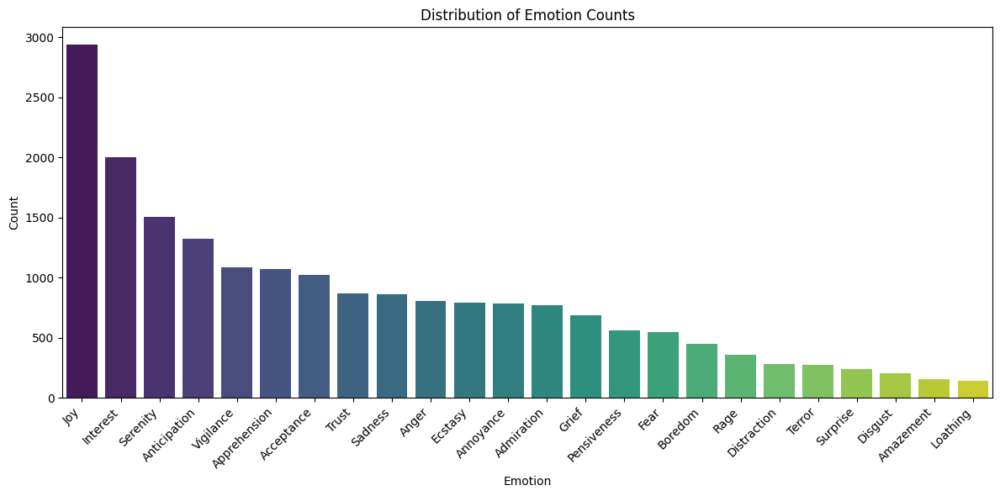

In [13]:
# Analysis: Count of each unique emotion
emotion_counts = df['emotion'].value_counts().sort_values(ascending=False)

# Visualisation: Bar plot of emotion counts
plt.figure(figsize=(12, 6))
sns.barplot(x=emotion_counts.index, y=emotion_counts.values, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Emotion Counts')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

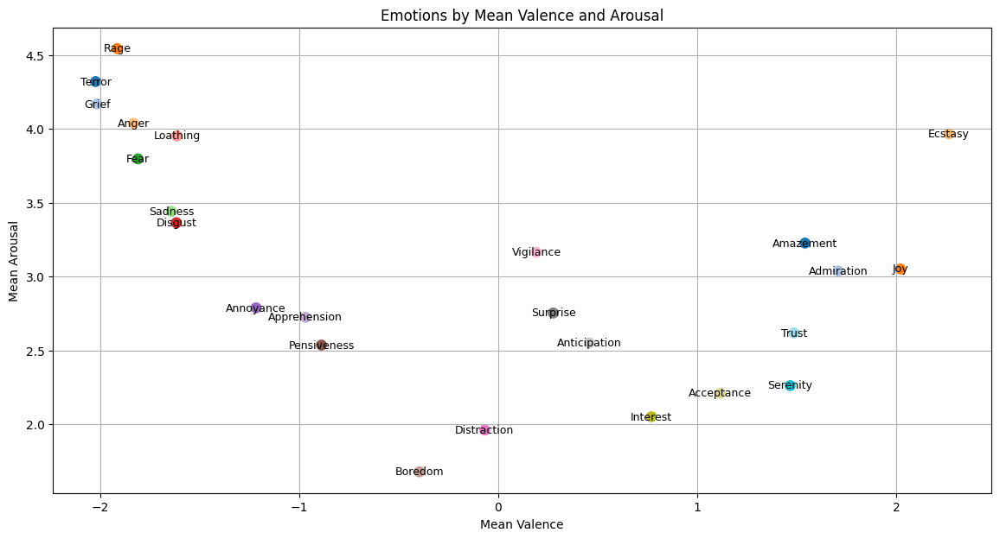

valence           arousal        
                  mean max min      mean max min
emotion                                         
Terror       -2.022059   3  -3  4.319853   6   0
Grief        -2.014599   3  -3  4.167883   6   0
Rage         -1.913649   3  -3  4.543175   6   0
Anger        -1.831683   3  -3  4.037129   6   0
Fear         -1.809091   3  -3  3.796364   6   0
Sadness      -1.641860   3  -3  3.440698   6   0
Disgust      -1.616505   3  -3  3.364078   6   1
Loathing     -1.613793   3  -3  3.951724   6   0
Annoyance    -1.216113   3  -3  2.787724   6   0
Apprehension -0.967351   3  -3  2.723881   6   0
Pensiveness  -0.887500   3  -3  2.535714   6   0
Boredom      -0.395973   3  -3  1.677852   6   0
Distraction  -0.067616   3  -3  1.960854   6   0
Vigilance     0.191352   3  -3  3.163753   6   0
Surprise      0.276151   3  -3  2.753138   6   0
Anticipation  0.457294   3  -3  2.550265   6   0
Interest      0.769346   3  -3  2.050924   6   0
Acceptance    1.115234   3  -3  2.209961   6   0
Serenity      1.466045   3  -3  2.261651   6   0
Trust         1.485092   3  -3  2.618119   6   0
Amazement     1.540881   3  -3  3.226415   6   0
Admiration    1.707254   3  -3  3.037565   6   0
Joy           2.019761   3  -3  3.051107   6   0
Ecstasy       2.262893   3  -3  3.966038   6   0

In [20]:
# Calculate the mean valence and arousal for each emotion
emotion_va_summary = df.groupby('emotion')[['valence', 'arousal']].agg(['mean', 'max', 'min']).sort_values(('valence', 'mean'))

# Visualize the relationship between emotions and their average valence/arousal
plt.figure(figsize=(14, 7))
sns.scatterplot(
    x=emotion_va_stats['valence'],
    y=emotion_va_stats['arousal'],
    hue=emotion_va_stats.index,
    palette='tab20',
    s=100,
    legend=False
)
for emotion, row in emotion_va_stats.iterrows():
    plt.text(row['valence'], row['arousal'], emotion, fontsize=9, ha='center', va='center')

plt.title('Emotions by Mean Valence and Arousal')
plt.xlabel('Mean Valence')
plt.ylabel('Mean Arousal')
plt.grid(True)
plt.show()

# Optionally, show the stats table
display(emotion_va_summary)

In [24]:
# Filter terror_df for rows with positive valence
terror_positive_valence = terror_df[terror_df['valence'] > 0]
display(terror_positive_valence)

,index,user,image_path,tags,age,valence,arousal,emotion,dec_factors,ambiguity,datetime
986,1835,5eb4021cb97d6b20fdec1c27,/Run_2/Seducing soldiers studio/Habanera-Photo...,Undefined,Adults,1,2,Terror,Neutral,1,2023-09-01 00:00:00.000000
1054,1973,60f41ae35227aa02240ba0d9,/Run_2/Peaceful seniors army/GettyImages-11905...,Undefined,Adults,2,3,Terror,"BodyLanguage,FacialExpression",3,2023-09-01 00:00:00.000000
1059,1980,60f41ae35227aa02240ba0d9,/Run_2/Guilt forty-something protest/656ce37d-...,Undefined,Adults,3,6,Terror,"BodyLanguage,FacialExpression",3,2023-09-01 00:00:00.000000
4297,7183,60d1b7642d082fa4cebddfd2,/Run_2/Fearful adults fall/niagara-falls-haunt...,Undefined,Adults,2,6,Terror,FacialExpression,0,2023-09-22 13:23:51.574851
5009,8288,611e1f608f92b6c9b825bcca,/Run_2/Exasperated people shop/mta-riders-tire...,Undefined,Young Adults,2,5,Terror,BodyLanguage,5,2023-10-05 16:02:40.586049
5033,8335,611e1f608f92b6c9b825bcca,/Run_2/Disgusted thirty-something soccer/Canad...,Undefined,Young Adults,3,5,Terror,FacialExpression,4,2023-10-05 16:05:33.947632
5042,8359,611e1f608f92b6c9b825bcca,/Run_2/Outraged teenagers gathering/3CA3277200...,Undefined,Young Adults,2,4,Terror,Context,4,2023-10-05 16:07:32.603951
5106,8460,61604e86279e4346e5fe6f2d,/Run_2/Violent adolescents army/file-20180514-...,Undefined,"Adults,Seniors",3,3,Terror,"ConflictCtxtPerson,FacialExpression",1,2023-10-05 16:15:11.603158
5503,9085,61138add299713969a18677d,/Run_2/Depressed retiree birthday/PKIFXZBJ3CN3...,Undefined,"Children,Adults",2,3,Terror,"BodyLanguage,FacialExpression,Staging",3,2023-10-17 14:25:15.431880
6340,10357,64fead10d35271cb8eafc1c2,/Run_2/Violent fifty-something court/1024x538_...,Undefined,"Young Adults,Adults",1,3,Terror,"BodyLanguage,FacialExpression,Staging",5,2023-11-10 14:24:41.906755


Images Analysis

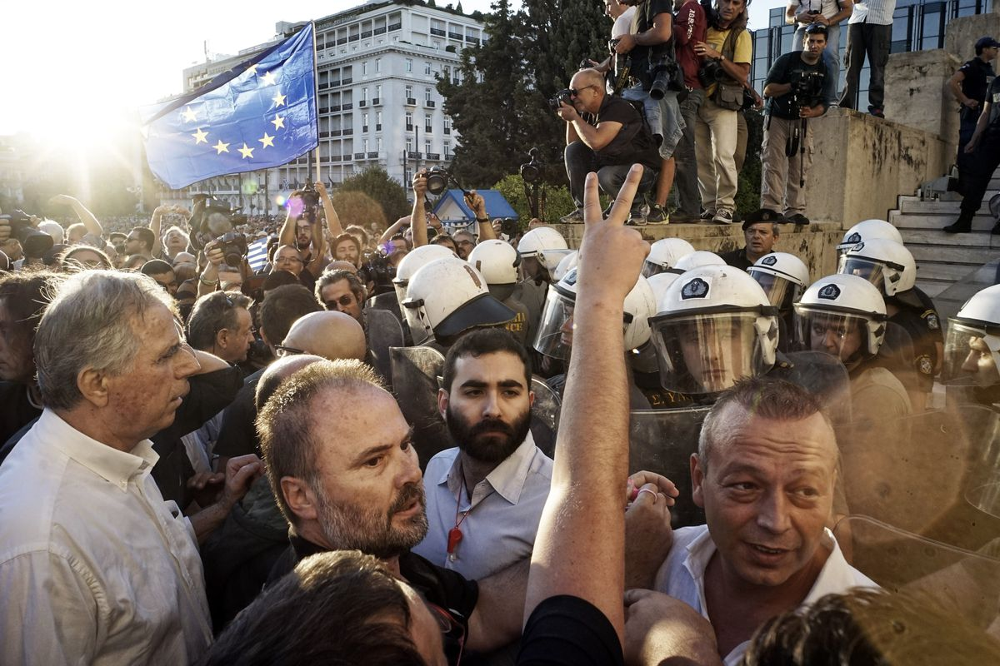

Displayed: GettyImages-478112136.0.jpg


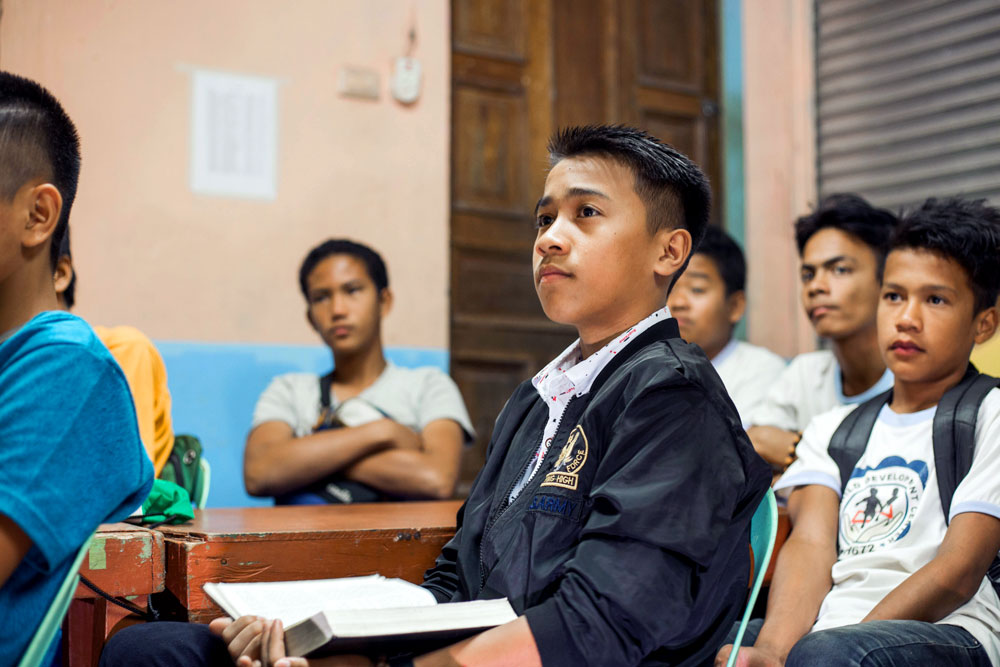

Displayed: web_CC-PH067200037-11-1901.jpg


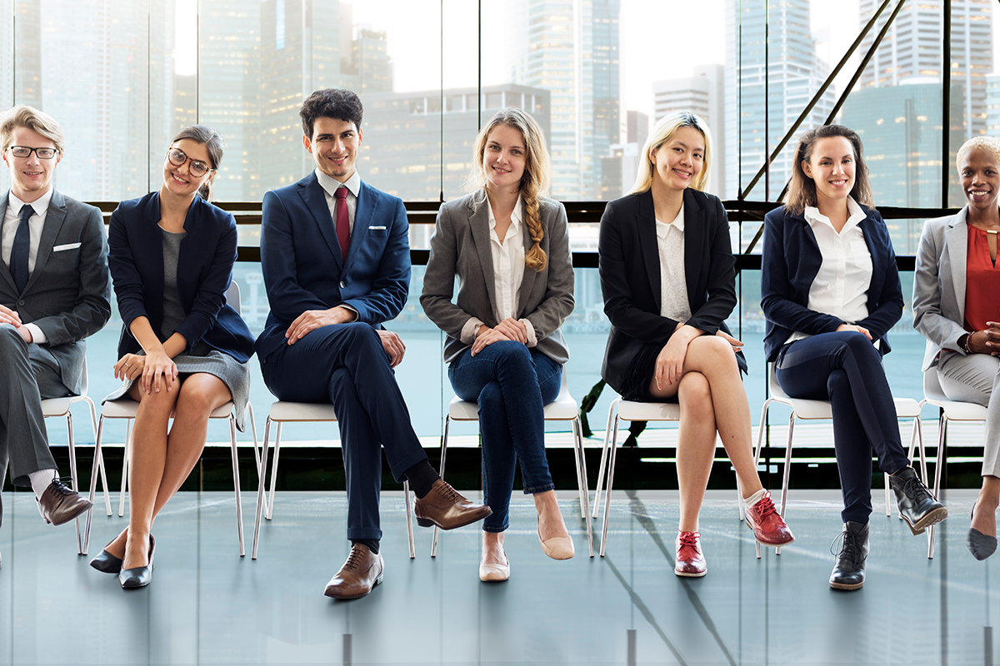

Displayed: 2018-07-16_AM_Appearance-Attorneys-blog.jpg


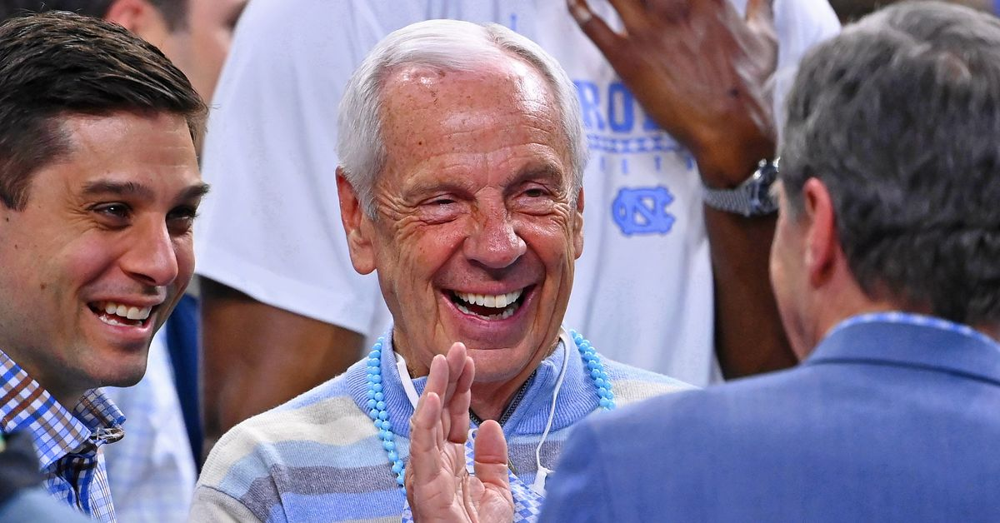

Displayed: 7e91365b-95dc-4d0d-963b-37c06938885b-USP_NCAA_Basketball__Final_Four-Semifinals-North_C_7.jpg


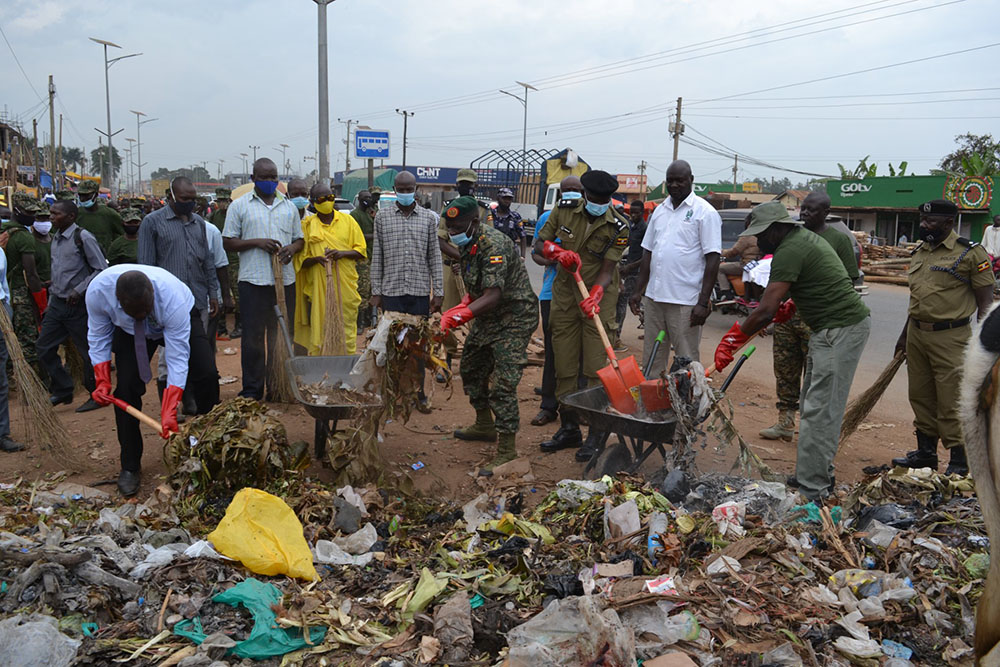

Displayed: 26582d8c-2509-4644-9919-b9da0570f90b.jpg


In [9]:
from PIL import Image
import random
import os

# Assuming 'path' is the directory containing the dataset
# base_dir = os.path.join(path, 'archive (3)') # Adjust 'archive (3)' if the actual image directory is different
# train_dir = os.path.join(base_dir, 'Train')
# test_dir = os.path.join(base_dir, 'Test')

image_files = []
for directory in [file_path_images1, file_path_images2]:
    if os.path.exists(directory):
        for root, _, files in os.walk(directory):
            for file in files:
                if file.endswith(('.jpg', '.jpeg', '.png')):
                    image_files.append(os.path.join(root, file))


# Display a few random images
num_images_to_display = 5
if image_files:
    random_images = random.sample(image_files, min(num_images_to_display, len(image_files)))

    for img_path in random_images:
        try:
            img = Image.open(img_path)
            display(img)
            print(f"Displayed: {os.path.basename(img_path)}")
        except Exception as e:
            print(f"Could not display {os.path.basename(img_path)}: {e}")
else:
    print(f"No image files found in {file_path_images1} or {file_path_images2}")